# Tarea 2

### Importante 1:
Este notebook está diseñado para ejecutar en Julia, si está trabajando en Python, genere un nuevo archivo ipynb para ejecutar Python y copie allí este archivo.

### Importante 2: ###
Renombre el archivo como: 
**nombredelgrupo_tarea_2.ipynb**

**Todo el código generado y la presentación deberá estar incluida en este notebook.**

**El objetivo de la tarea es variado:**

1. Familiarizarse con la ecuación de ondas o ecuaciones hiperbólicas en general.
2. Familiarizarse con los operadores diferencias finitas de distinto orden.
3. Ver la importancia en la elección del integrador temporal.
4. Comprobar cualitativa y cuantitativamente los errores de la aproximación. 
5. Estudiar convergencia de los métodos.  
6. Ver las limitaciones del método cuando se generan ondas de choque.


------
**1)**
Juegue con el código adjunto (Wave_equation): a) Cambie condiciones iniciales; b) evoluciones a distintos tiempos; c) grafique distintas variables o funciones de las mismas; d) intente graficar una animación de la solución; e) pruebe distintas resoluciones espaciales y temporales (que sucede si toma dt muy grande?) Explique. Calcule la energía de la solución y vea qué tan bien se conserva.

------

In [3]:
M = [2 4; 1 8]//1
f = [1;0]
AB = M\f

2-element Vector{Rational{Int64}}:
  2//3
 -1//12

In [4]:
using OrdinaryDiffEq  #Esta es solo una parte del paquete DifferentialEquations
using Plots
using LinearAlgebra
using BandedMatrices
using SparseArrays

Parámetros

In [5]:
N = 100            # Numeros de puntos en la discretización espacial
L = 1.0            # Intervalo espacial
dx = L/N           # dx
T = 10.            # Tiempo final
dt = 1. *dx;        # Tomamos dt ≈ dx/speed_max, para mantener la condición CFL y
                   # Garantizar la estabilidad del algoritmo.

Esquemas de Diferencias Finitas

In [6]:
function create_D_2_per(N)
    D_2_per = sparse(Tridiagonal([-0.5 for i in 1:N-1],[0.0 for i in 1:N],[0.5 for i in 1:N-1]))
    D_2_per[1,end] = -0.5
    D_2_per[end,1] = 0.5
    dropzeros!(D_2_per)
    return D_2_per
end


function create_D2_2_per(N) # derivada segunda
    D2_2_per = BandedMatrix{Float64}(Zeros(N,N), (N-1,N-1))
    D2_2_per[band(0)] .= -2.0
    D2_2_per[band(1)] .= 1.0
    D2_2_per[band(-1)] .= 1.0
    
    D2_2_per[band(N-1)] .= 1.0
    D2_2_per[band(-N+1)] .= 1.0
    
    D2_2_per = sparse(D2_2_per)
    dropzeros!(D2_2_per)
    return D2_2_per
end

function create_D_4_per(N)
    D_4_per = BandedMatrix{Float64}(Zeros(N,N), (N-1,N-1))
    D_4_per[band(0)] .= 0.0
    D_4_per[band(1)] .= 2.0/3.0
    D_4_per[band(-1)] .= -2.0/3.0
    D_4_per[band(2)] .= -1.0/12.0
    D_4_per[band(-2)] .= 1.0/12.0
    
    D_4_per[band(N-1)] .= -2.0/3.0
    D_4_per[band(N-2)] .= 1.0/12.0
    
    D_4_per[band(-N+1)] .= 2.0/3.0
    D_4_per[band(-N+2)] .= -1.0/12.0
    
    D_4_per = sparse(D_4_per)
    dropzeros!(D_4_per)
    return D_4_per
end

create_D_4_per (generic function with 1 method)

Lado derecho (la discretización espacial)

In [7]:
function F!(dr,r,p,t)
    # second order version
    dx, D = p
    h = 1. /dx
    u = @view r[:,1]
    v = @view r[:,2]
    du = @view dr[:,1]
    dv = @view dr[:,2]
    mul!(du, D, v, h, 0)  #du/dt = h*Dv
    mul!(dv, D, u, h, 0)  #dv/dt = h*Du
    #Nota: mul!(C, A, B, α, β) hace la operación α*A*B + β*C y la guarda en C
end;

Condiciones Iniciales

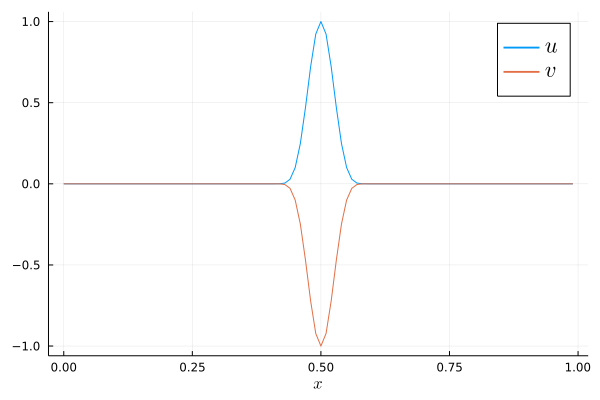

In [8]:
r0=zeros(N,2)      # Discretización de los campos u y v
x = [dx*i for i in 0:N-1];      # Coordenadas x, necesarias para determinar el dato inicial.

x0 = 0.4; x1 = 0.6
u = @view r0[:,1]
v = @view r0[:,2]

for i in 1:N
    x[i] = dx*(i-1)
    if x[i] > x0 && x[i] < x1
        u[i] = (x[i] - x0)^8 * (x[i] - x1)^8 / (0.5*(x1-x0))^16
        v[i] = -u[i]
    end
end

plot(x, r0, label = ["\$u\$" "\$v\$"], xlabel = "\$x\$", legendfontsize = 15)

Definimos los problemas

In [9]:
D_2_per = create_D_2_per(N)
D_4_per = create_D_4_per(N)

p2 = (dx, D_2_per)
p4 = (dx, D_4_per)
@time prob2 = ODEProblem(F!,r0,(0.0,T),p2);
@time prob4 = ODEProblem(F!,r0,(0.0,T),p4);

  0.341678 seconds (392.87 k allocations: 22.343 MiB, 98.47% compilation time)
  0.000100 seconds (60 allocations: 2.750 KiB)


Resolvemos

In [10]:
@time sol2 = solve(prob2,RK4(),dt=dt);

  7.574428 seconds (9.70 M allocations: 826.628 MiB, 4.34% gc time, 99.55% compilation time)


In [11]:
@time sol4 = solve(prob4,RK4(),dt=dt);

  0.069522 seconds (10.39 k allocations: 13.700 MiB)


┌ Info: Saved animation to 
│   fn = H:\2022\PDE_FAMAF\GIT_Famaf_PDE\Problems\Numéricos\Tarea 2\wave_anim_fps10.gif
└ @ Plots C:\Users\invmecanica-m8\.julia\packages\Plots\lW9ll\src\animation.jl:137


Plots.AnimatedGif("H:\\2022\\PDE_FAMAF\\GIT_Famaf_PDE\\Problems\\Numéricos\\Tarea 2\\wave_anim_fps10.gif")
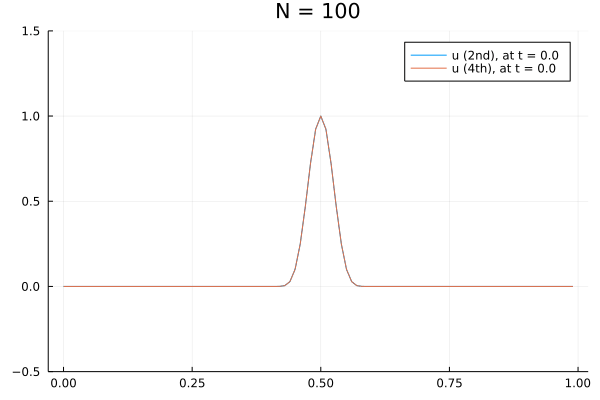

In [12]:
anim = @animate for i in 0:100
    plot(x, sol2(i*T/100)[:,1], ylim = (-0.5, 1.5), label = "u (2nd), at t = $(i*T/100)")
    plot!(x, sol4(i*T/100)[:,1], ylim = (-0.5, 1.5), label = "u (4th), at t = $(i*T/100)",title="N = $N")
end

gif(anim, "wave_anim_fps10.gif", fps = 10)

**Energía Potencial y Cinética**
La ecuación de una onda en una cuerda bajo tensión $F$ es

$$
\frac{\partial^2 \phi}{\partial x^2 } = \frac{1}{c^2}\frac{\partial^2 \phi}{\partial t^2}
$$

con $c = \sqrt{F/\rho}$ y la densidad $\rho$.


La densidad de energía cinética $E_K$ y la Potencial $E_P$ están dadas por
$$
E_K = \frac{1}{2} \int_0^L\rho \left( \frac{\partial \phi }{\partial t} \right)^2 dx,\ \ \ E_P = \frac{1}{2}\int_0^L F \left( \frac{\partial \phi }{\partial x} \right)^2 dx
$$

$$
E_K = \frac{1}{2} \int_0^L\rho \left(v \right)^2 dx,\ \ \ E_P = \frac{1}{2}\int_0^L F \left( u \right)^2 dx
$$

con $\rho=1, F = 1$, se tiene
$$
E_K = \frac{1}{2} \int_0^L v^2 dx,\ \ \ E_P = \frac{1}{2}\int_0^L  u^2 dx
$$

Usando la regla del trapecio, que tiene convergencia exponencial para funciones suaves y periódicas (*Weideman, J. A. C. (2002). Numerical integration of periodic functions: A few examples. The American mathematical monthly, 109(1), 21-36.*), para una función $f(x)$
$$
\int_a^b f(x)dx \approx \frac{b-a}{N}\left(\frac{f(a)}{2}+\frac{f(b)}{2}+\sum_{k=1}^{N}f(x_k) \right)
$$
definida en la siguiente función `quad_trap`

In [13]:
function quad_trap(fxk,a,b) 
    # fxk: array with values of integrad at x_k
    # a, b, ends of the interval
    N = length(fxk)
    h = (b-a)/(N-1)
    # println(N)
    # println(h)
    # println(size(fxk))
    # println(h*(sum(fxk[2:end-1])))
    # println(h*(fxk[1]/2.0 + fxk[end]/2.0))
    # println(h*(fxk[1]/2.0 + fxk[end]/2.0+ sum(fxk[2:end-1])))
    return h*(fxk[1]/2.0 + fxk[end]/2.0+ sum(fxk[2:end-1]))
end;


Verificación con la integral $\int_0^b (x^n+c )dx = \frac{b^{n+1}}{n+1}+cb$

In [14]:
# Verificación
xint = 0.0:1//800:1.0 # puntos en el intervalo
nex = 3;
c= 1.0;
y = xint.^nex.+c; # integrando
intEx = xint[end]^(nex+1)/(nex+1)+c*xint[end]  # valor exacto de la integral
println("  Exacto: $intEx")
# y = x
intTrap = quad_trap(y,xint[1],xint[end])
println("Trapecio: $intTrap")


  Exacto: 1.25
Trapecio: 1.2500003906250003


$$
E_K = \frac{1}{2} \int_0^L v^2 dx,\ \ \ E_P = \frac{1}{2}\int_0^L  u^2 dx
$$

In [15]:

tint = 0:dt:T
# sizeT = size(tint,1)

 # t = [sol2.t[i] for i in 1:length(sol2.t)]
u2 = [sol2(0)[i,1] for i in 1:length(sol2(0)[:,1])]
push!(u2,u2[1])
# push!(x,L)
# size(sol2(0)[:,:])
# size(sol2.t)

# sizeT = 101
sizeT = length(sol2.t)
Ek2 = zeros(sizeT,1)
Ep2 = zeros(sizeT,1)

Ek4 = zeros(sizeT,1)
Ep4 = zeros(sizeT,1)


for i in 1:sizeT
    # Ek2[i] = 1.0/2.0*quad_trap(sol2((i-1)*T/sizeT)[:,2].^2,0.0,L)
    t = sol2.t[i]
    u2 = [sol2(t)[i,1] for i in 1:length(sol2(0)[:,1])]
    push!(u2,u2[1])
    u4 = [sol4(t)[i,1] for i in 1:length(sol4(0)[:,1])]
    push!(u4,u4[1])
    #
    v2 = [sol2(t)[i,2] for i in 1:length(sol2(0)[:,2])]
    push!(v2,v2[1])
    v4 = [sol4(t)[i,2] for i in 1:length(sol4(0)[:,2])]
    push!(v4,v4[1])
    
    Ep2[i] = 1.0/2.0*quad_trap(u2.^2,0.0,L)
    Ek2[i] = 1.0/2.0*quad_trap(v2.^2,0.0,L)
    
    Ep4[i] = 1.0/2.0*quad_trap(u4.^2,0.0,L)
    Ek4[i] = 1.0/2.0*quad_trap(v4.^2,0.0,L)
    # println(i)
end

# println(size(tint,1))
# println(size(t))
# println(size(u2))
println(size(u2.^2))
# println(size(x))
# size(tint)
# plot(tint,Ek,ylim=(0,10))

(101,)


0.02165276496902254


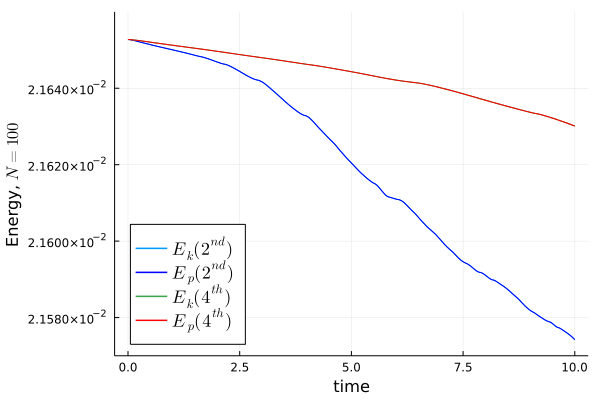

In [16]:
# plot(x,u2.^2)
# plot!(x,u2)
println(Ek4[1])
# plot(sol4, vars=(1,2,3))
tint = sol2.t
pltE = plot(tint,Ek2,label="\$E_k (2^{nd})",legendfontsize = 12)
plot!(pltE,tint,Ep2,label="\$E_p (2^{nd})",legendfontsize = 12, color=:blue)
plot!(pltE,tint,Ek4,label="\$E_k (4^{th})",legendfontsize = 12)
plot!(pltE,tint,Ep4,label="\$E_p (4^{th})",legendfontsize = 12, color=:red)
plot!(pltE,legend=:bottomleft,xlabel="time",ylabel="Energy, \$N =100\$",ylim=(2.1570e-2,2.166e-2))


# size(sol2((0-1)*T/size(tint,1))[:,2].^2)
# plot(x,sol2((1-1)*T/size(tint,1))[:,2].^2)
# plot(x,sol2((0-1)*T/dt)[:,2].^2)


-----
**Aumentando la cantidad puntos** 

desde $ N = 200$ a $ N = 400$


In [17]:
N = 400            # Numeros de puntos en la discretización espacial
L = 1.0            # Intervalo espacial
dx = L/N           # dx
T = 10.            # Tiempo final
dt = 1. *dx;        # Tomamos dt ≈ dx/speed_max, para mantener la condición CFL y
                   # Garantizar la estabilidad del algoritmo.

In [18]:
r0=zeros(N,2)      # Discretización de los campos u y v
x = [dx*i for i in 0:N-1];      # Coordenadas x, necesarias para determinar el dato inicial.

x0 = 0.4; x1 = 0.6
u = @view r0[:,1]
v = @view r0[:,2]

for i in 1:N
    x[i] = dx*(i-1)
    if x[i] > x0 && x[i] < x1
        u[i] = (x[i] - x0)^8 * (x[i] - x1)^8 / (0.5*(x1-x0))^16
        v[i] = -u[i]
    end
end

# plot(x, r0, label = ["\$u\$" "\$v\$"], xlabel = "\$x\$", legendfontsize = 15)

In [19]:
D_2_per = create_D_2_per(N)
D_4_per = create_D_4_per(N)

p2 = (dx, D_2_per)
p4 = (dx, D_4_per)
@time prob2 = ODEProblem(F!,r0,(0.0,T),p2);
@time prob4 = ODEProblem(F!,r0,(0.0,T),p4);

  0.000105 seconds (60 allocations: 2.750 KiB)
  0.000103 seconds (60 allocations: 2.750 KiB)


In [20]:
@time sol2_400 = solve(prob2,RK4(),dt=dt);

  0.235632 seconds (11.25 k allocations: 52.683 MiB, 17.63% gc time)


In [21]:
@time sol4_400 = solve(prob4,RK4(),dt=dt);

  0.281000 seconds (12.20 k allocations: 57.105 MiB)


┌ Info: Saved animation to 
│   fn = H:\2022\PDE_FAMAF\GIT_Famaf_PDE\Problems\Numéricos\Tarea 2\wave_anim_fps10_N400.gif
└ @ Plots C:\Users\invmecanica-m8\.julia\packages\Plots\lW9ll\src\animation.jl:137


Plots.AnimatedGif("H:\\2022\\PDE_FAMAF\\GIT_Famaf_PDE\\Problems\\Numéricos\\Tarea 2\\wave_anim_fps10_N400.gif")
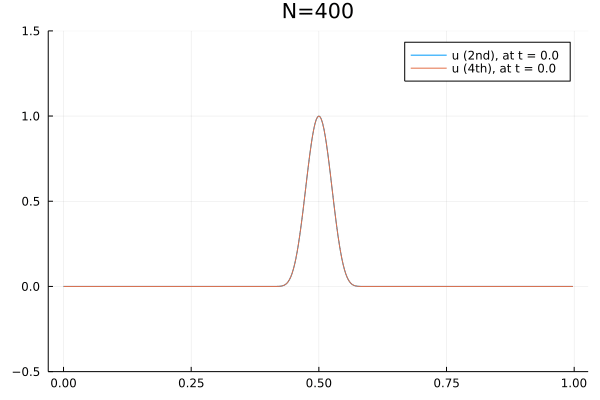

In [22]:
anim = @animate for i in 0:100
    plot(x, sol2_400(i*T/100)[:,1], ylim = (-0.5, 1.5), label = "u (2nd), at t = $(i*T/100)")
    plot!(x, sol4_400(i*T/100)[:,1], ylim = (-0.5, 1.5), label = "u (4th), at t = $(i*T/100)",title="N=$N")
end

gif(anim, "wave_anim_fps10_N400.gif", fps = 10)

**Energía**

In [23]:

sizeT = length(sol2_400.t)
Ek2_400 = zeros(sizeT,1)
Ep2_400 = zeros(sizeT,1)

Ek4_400 = zeros(sizeT,1)
Ep4_400 = zeros(sizeT,1)


for i in 1:sizeT
    # Ek2[i] = 1.0/2.0*quad_trap(sol2((i-1)*T/sizeT)[:,2].^2,0.0,L)
    t = sol2_400.t[i]
    u2 = [sol2_400(t)[i,1] for i in 1:length(sol2_400(0)[:,1])]
    push!(u2,u2[1])
    u4 = [sol4_400(t)[i,1] for i in 1:length(sol4_400(0)[:,1])]
    push!(u4,u4[1])
    #
    v2 = [sol2_400(t)[i,2] for i in 1:length(sol2_400(0)[:,2])]
    push!(v2,v2[1])
    v4 = [sol4_400(t)[i,2] for i in 1:length(sol4_400(0)[:,2])]
    push!(v4,v4[1])
    
    Ep2_400[i] = 1.0/2.0*quad_trap(u2.^2,0.0,L)
    Ek2_400[i] = 1.0/2.0*quad_trap(v2.^2,0.0,L)
    
    Ep4_400[i] = 1.0/2.0*quad_trap(u4.^2,0.0,L)
    Ek4_400[i] = 1.0/2.0*quad_trap(v4.^2,0.0,L)
    # println(i)
end

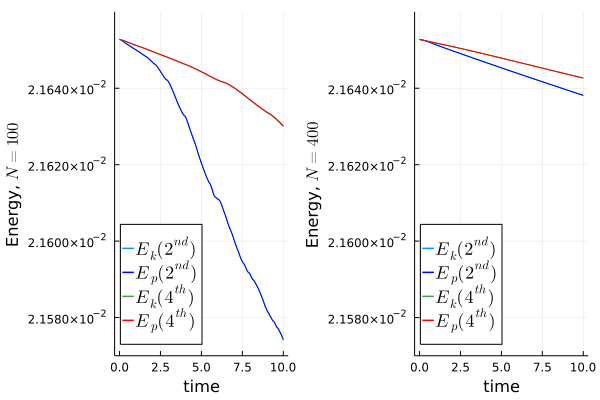

In [24]:
# println(Ek4[2])
tint = sol2_400.t

pltE400 = plot(tint,Ek2_400,label="\$E_k (2^{nd})",legendfontsize = 12)
plot!(pltE400,tint,Ep2_400,label="\$E_p (2^{nd})",legendfontsize = 12,color=:blue)
plot!(pltE400,tint,Ek4_400,label="\$E_k (4^{th})",legendfontsize = 12)
plot!(pltE400,tint,Ep4_400,label="\$E_p (4^{th})",legendfontsize = 12,color=:red)
plot!(pltE400,legend=:bottomleft,xlabel="time",ylabel="Energy, \$N =$N\$",ylim=(2.1570e-2,2.166e-2))
plot!(pltE,pltE400,layout=(1,2))


Modificando condiciones iniciales

In [25]:
N = 500            # Numeros de puntos en la discretización espacial
L = 1.0            # Intervalo espacial
dx = L/N           # dx
T = 100.            # Tiempo final
dt = 1. *dx;        # Tomamos dt ≈ dx/speed_max, para mantener la condición CFL y
                   # Garantizar la estabilidad del algoritmo.

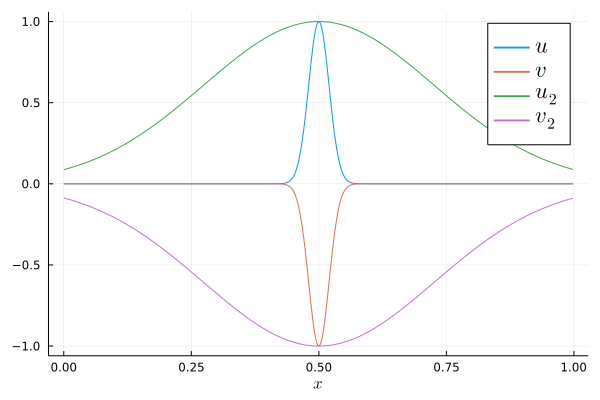

In [26]:
r0=zeros(N,2)      # Discretización de los campos u y v
r0_2=zeros(N,2)      # Discretización de los campos u y v
x = [dx*i for i in 0:N-1];      # Coordenadas x, necesarias para determinar el dato inicial.

x0 = 0.4; x1 = 0.6
u = @view r0[:,1]
v = @view r0[:,2]
u_2 = @view r0_2[:,1]
v_2 = @view r0_2[:,2]

b = 0.5
c = 0.02
for i in 1:N
    x[i] = dx*(i-1)
#     if x[i] > x0 && x[i] < x1
#         # u[i] = 1.0
#         u[i] = sin((x[i]-x0)/(x1-x0)*2π+π/2*3)+1
#         v[i] = -u[i]
#     end
    α = (x[i]-x0)/(x1-x0)*2π+π/2*3
    # u[i] = sin(α)+1+cos(2*α)+cos(4*α)*0.5
    # u[i] = (x[i]-0.5)^2*exp(-(x[i]-0.5)^2/.01)
    u[i] = exp(-(x[i]-b)^2/(2*c^2))
    u_2[i] = exp(-(x[i]-b)^2/(2*128*c^2))
    v[i] = -u[i]
    v_2[i] = -u_2[i]
end

plot(x, r0, label = ["\$u\$" "\$v\$"], xlabel = "\$x\$", legendfontsize = 15)
plot!(x, r0_2, label = ["\$u_2\$" "\$v_2\$"], xlabel = "\$x\$", legendfontsize = 15)

In [27]:
D_4_per_2 = create_D_4_per(N)
D_4_per_22 = create_D_4_per(N)

p4_2 = (dx, D_4_per_2)
p4_22 = (dx, D_4_per_22)
@time prob4_2 = ODEProblem(F!,r0,(0.0,T),p4_2);
@time prob4_22 = ODEProblem(F!,r0_2,(0.0,T),p4_22);

  0.000162 seconds (60 allocations: 2.750 KiB)
  0.000147 seconds (60 allocations: 2.750 KiB)


In [28]:
@time sol4_400_2 = solve(prob4_2,RK4(),dt=dt);
@time sol4_400_22 = solve(prob4_22,RK4(),dt=dt);

  4.316829 seconds (129.56 k allocations: 757.610 MiB, 10.92% gc time)
  3.008863 seconds (97.12 k allocations: 566.978 MiB)


┌ Info: Saved animation to 
│   fn = H:\2022\PDE_FAMAF\GIT_Famaf_PDE\Problems\Numéricos\Tarea 2\wave_anim_fps10_2IC.gif
└ @ Plots C:\Users\invmecanica-m8\.julia\packages\Plots\lW9ll\src\animation.jl:137


Plots.AnimatedGif("H:\\2022\\PDE_FAMAF\\GIT_Famaf_PDE\\Problems\\Numéricos\\Tarea 2\\wave_anim_fps10_2IC.gif")
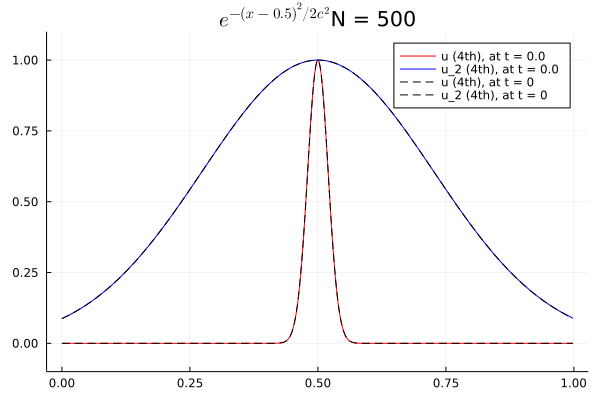

In [29]:
NN = 100
anim = @animate for i in 0:NN
    plot(x, sol4_400_2(i*T/NN)[:,1],color=:red, ylim = (-0.1, 1.1), label = "u (4th), at t = $(i*T/NN)",title="\$e^{-(x-0.5)^2/2c^2}\$N = $N")
    plot!(x, sol4_400_22(i*T/NN)[:,1],color=:blue, ylim = (-0.1, 1.1), label = "u_2 (4th), at t = $(i*T/NN)")
    plot!(x, r0[:,1],linestyle=:dash,color=:black, label = "u (4th), at t = 0")
    plot!(x, r0_2[:,1],linestyle=:dash,color=:black, label = "u_2 (4th), at t = 0")
    
end

gif(anim, "wave_anim_fps10_2IC.gif", fps = 20)

------
**2)** Cree operadores differencia finita de orden 6 y 8. Aplíquelos a la ecuación de onda. Juntos con los ya presentes (orden 2 y 4), evolucione las ecuaciones hasta T=100 y compare los resultados con la solución exacta
(al cabo de períodos enteros la solución exacta coincide con el dato inicial).
Haga un plot de las distintas aproximaciones. 

------






La ecuación de una onda en una cuerda bajo tensión $F$ es

$$
\frac{\partial^2 y}{\partial x^2 } = \frac{1}{c^2}\frac{\partial^2 y}{\partial t^2}
$$

con $c = \sqrt{F/\rho}$ y la densidad $\rho$.

El sistema a resolver seá:
$$
\begin{align*}
    y_{t} &= v\\
    v_t &= u_x\\
    u_t &= v_x
\end{align*}
$$

**Energía Potencial y Cinética**

La densidad de energía cinética $E_K$ y la Potencial $E_P$ están dadas por
$$
E_K = \frac{1}{2} \int_0^L\rho \left( \frac{\partial y }{\partial t} \right)^2 dx,\ \ \ E_P = \frac{1}{2}\int_0^L F \left( \frac{\partial y }{\partial x} \right)^2 dx
$$

-----
El operador de differencias finitas de $6^{to}$ orden se puede definir como:

$$
\begin{align*}
D_6f(x) = \frac{1}{h}[&Af(x-h)+Bf(x-2h)+Cf(x-3h)\\
-&Af(x+h)-Bf(x+2h)-Cf(x+3h)]
\end{align*}
$$
con los coeficientes $A, B$ y $C$ a calcular para cumplir con el orden de aproximación. 

La expansión en series de Taylor de la función $f(x)$ para un incremento de $h$
$$
f(x+h) = f(x)+h f^{(1)}(x)+\frac{h^2}{2}f^{(2)}(x)+\frac{h^3}{6}f^{(3)}(x)+\frac{h^4}{24}f^{(4)}(x)+\frac{h^5}{120}f^{(5)}(x)+\mathcal{O}(h^6)
$$
para un incremento de $-h$ queda
$$
f(x-h) = f(x)-h f^{(1)}(x)+\frac{h^2}{2}f^{(2)}(x)-\frac{h^3}{6}f^{(3)}(x)+\frac{h^4}{24}f^{(4)}(x)-\frac{h^5}{120}f^{(5)}(x)+\mathcal{O}(h^6)
$$
para $2h$
$$
f(x+2h) = f(x)+2h f^{(1)}(x)+\frac{(2h)^2}{2}f^{(2)}(x)+\frac{(2h)^3}{6}f^{(3)}(x)+\frac{(2h)^4}{24}f^{(4)}(x)+\frac{(2h)^5}{120}f^{(5)}(x)+\mathcal{O}(h^6)
$$

$$
f(x+2h) = f(x)+2h f^{(1)}(x)+4\frac{h^2}{2}f^{(2)}(x)+8\frac{h^3}{6}f^{(3)}(x)+16\frac{h^4}{24}f^{(4)}(x)+4\frac{h^5}{15}f^{(5)}(x)+\mathcal{O}(h^6)
$$

$$
f(x+2h) = f(x)+2h f^{(1)}(x)+2h^2f^{(2)}(x)+4\frac{h^3}{3}f^{(3)}(x)+2\frac{h^4}{3}f^{(4)}(x)+4\frac{h^5}{15}f^{(5)}(x)+\mathcal{O}(h^6)
$$
para $-2h$
$$
f(x-2h) = f(x)-2h f^{(1)}(x)+2h^2f^{(2)}(x)-4\frac{h^3}{3}f^{(3)}(x)+2\frac{h^4}{3}f^{(4)}(x)-4\frac{h^5}{15}f^{(5)}(x)+\mathcal{O}(h^6)
$$
para $3h$
$$
f(x+3h) = f(x)+3h f^{(1)}(x)+\frac{(3h)^2}{2}f^{(2)}(x)+\frac{(3h)^3}{6}f^{(3)}(x)+\frac{(3h)^4}{24}f^{(4)}(x)+\frac{(3h)^5}{120}f^{(5)}(x)+\mathcal{O}(h^6)
$$

$$
f(x+3h) = f(x)+3h f^{(1)}(x)+9\frac{h^2}{2}f^{(2)}(x)+9\frac{h^3}{2}f^{(3)}(x)+27\frac{h^4}{8}f^{(4)}(x)+81\frac{h^5}{40}f^{(5)}(x)+\mathcal{O}(h^6)
$$
para $-3h$
$$
f(x-3h) = f(x)-3h f^{(1)}(x)+9\frac{h^2}{2}f^{(2)}(x)-9\frac{h^3}{2}f^{(3)}(x)+27\frac{h^4}{8}f^{(4)}(x)-81\frac{h^5}{40}f^{(5)}(x)+\mathcal{O}(h^6)
$$



haciendo la diferencia $f^{(1)}(x)-D_6f(x) $ y reemplazando las expansiones en el operador tenemos
$$
\begin{align*}
f^{(1)}(x)-D_6f(x) = f^{(1)}(x)- \frac{1}{h}[&Af(x-h)+Bf(x-2h)+Cf(x-3h)\\
-&Af(x+h)-Bf(x+2h)-Cf(x+3h)]
\end{align*}
$$


$$
\begin{align*}
f^{(1)}(x)-D_6f(x) = f^{(1)}(x)-\frac{1}{h}[&A\left(f(x)+h f^{(1)}(x)+\frac{h^2}{2}f^{(2)}(x)+\frac{h^3}{6}f^{(3)}(x)+\frac{h^4}{24}f^{(4)}(x)+\frac{h^5}{120}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
+&B\left(f(x)+2h f^{(1)}(x)+2h^2f^{(2)}(x)+4\frac{h^3}{3}f^{(3)}(x)+2\frac{h^4}{3}f^{(4)}(x)+4\frac{h^5}{15}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
+&C\left(f(x)+3h f^{(1)}(x)+9\frac{h^2}{2}f^{(2)}(x)+9\frac{h^3}{2}f^{(3)}(x)+27\frac{h^4}{8}f^{(4)}(x)+81\frac{h^5}{40}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
-&A\left(f(x)-h f^{(1)}(x)+\frac{h^2}{2}f^{(2)}(x)-\frac{h^3}{6}f^{(3)}(x)+\frac{h^4}{24}f^{(4)}(x)-\frac{h^5}{120}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
-&B\left(f(x)-2h f^{(1)}(x)+2h^2f^{(2)}(x)-4\frac{h^3}{3}f^{(3)}(x)+2\frac{h^4}{3}f^{(4)}(x)-4\frac{h^5}{15}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
-&C\left(f(x)-3h f^{(1)}(x)+9\frac{h^2}{2}f^{(2)}(x)-9\frac{h^3}{2}f^{(3)}(x)+27\frac{h^4}{8}f^{(4)}(x)-81\frac{h^5}{40}f^{(5)}(x)+\mathcal{O}(h^6)\right)]
\end{align*}
$$



Se eliminarán los términos con $f(x),f^{(2)}(x),f^{(4)}(x)$

$$
\begin{align*}
f^{(1)}(x)-D_6f(x) = f^{(1)}(x)-\frac{1}{h}[&A\left(+h f^{(1)}(x)+\frac{h^3}{6}f^{(3)}(x)+\frac{h^5}{120}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
+&B\left(+2h f^{(1)}(x)+4\frac{h^3}{3}f^{(3)}(x)+4\frac{h^5}{15}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
+&C\left(+3h f^{(1)}(x)+9\frac{h^3}{2}f^{(3)}(x)+81\frac{h^5}{40}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
-&A\left(-h f^{(1)}(x)-\frac{h^3}{6}f^{(3)}(x)-\frac{h^5}{120}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
-&B\left(-2h f^{(1)}(x)-4\frac{h^3}{3}f^{(3)}(x)-4\frac{h^5}{15}f^{(5)}(x)+\mathcal{O}(h^6)\right)\\
-&C\left(-3h f^{(1)}(x)-9\frac{h^3}{2}f^{(3)}(x)-81\frac{h^5}{40}f^{(5)}(x)+\mathcal{O}(h^6)\right)]
\end{align*}
$$


agrupando los términos que multiplican a $f^{(1)}(x),f^{(3)}(x)$ y $f^{(5)}(x)$ se tiene
$$
\begin{align*}
f^{(1)}(x)-D_6f(x) = f&^{(1)}(x)\left(1+2A+4B+6C\right)\\
+f&^{(3)}(x)\left(\frac{h^2}{3}A+\frac{8h^2}{3}B+9h^2C\right)\\
+f&^{(5)}(x)\left(\frac{h^4}{60}A+\frac{8h^4}{15}B+\frac{81h^4}{20}C\right)+\mathcal{O}(h^6)
\end{align*}
$$

para que el operador tenga orden de aproximación $6^{to}$ se debe cumplir
$$
\begin{align*}
\left(1+2A+4B+6C\right)&=0\\
\left(\frac{h^2}{3}A+\frac{8h^2}{3}B+9h^2C\right)&=0\\
\left(\frac{h^4}{60}A+\frac{8h^4}{15}B+\frac{81h^4}{20}C\right)&=0
\end{align*}
$$

como $h$ no es nulo
$$
\begin{align*}
1+2A+4B+6C&=0\\
A+8B+27C &=0\\
A+32B+243C &=0
\end{align*}
$$

In [30]:
# M = [2 4 6; 1 8 27; 1 32 243]
# f = [1; 0; 0]

M = [2 4 6; 1 8 27; 1 32 243].//1
f = [-1; 0; 0].//1

ABC= M\f

3-element Vector{Rational{Int64}}:
 -3//4
  3//20
 -1//60

El operador queda
$$
\begin{align*}
D_6f(x) = -&\frac{3}{4h}[f(x-h)-f(x+h)]\\
 +&\frac{3}{20h}[f(x-2h)-f(x+2h)]\\
 -&\frac{1}{60h}[f(x-3h)-f(x+3h)]
\end{align*}
$$

--------
El operador de differencias finitas de $8^{vo}$ orden se puede definir como:

$$
\begin{align*}
D_8f(x) = \frac{1}{h}[&Af(x-h)+Bf(x-2h)+Cf(x-3h)+Df(x-4h)\\
-&Af(x+h)-Bf(x+2h)-Cf(x+3h)-Df(x+4h)]
\end{align*}
$$
con los coeficientes $A, B, C$ y $D$ a calcular para cumplir con el orden de aproximación. 



$$
\begin{align*}
f^{(1)}(x)-D_8f(x) = f^{(1)}(x)-\frac{1}{h}[
&A\left(+h f^{(1)}(x)+\frac{h^3}{6}f^{(3)}(x)+\frac{h^5}{120}f^{(5)}(x)+\frac{h^7}{5040}f^{(7)}(x)+\mathcal{O}(h^8)\right)\\
+&B\left(+2h f^{(1)}(x)+4\frac{h^3}{3}f^{(3)}(x)+4\frac{h^5}{15}f^{(5)}(x)+\frac{8h^7}{315}f^{(7)}(x)+\mathcal{O}(h^8)\right)\\
+&C\left(+3h f^{(1)}(x)+9\frac{h^3}{2}f^{(3)}(x)+81\frac{h^5}{40}f^{(5)}(x)+\frac{243h^7}{560}f^{(7)}(x)+\mathcal{O}(h^8)\right)\\
+&D\left(+4h f^{(1)}(x)+32\frac{h^3}{3}f^{(3)}(x)+128\frac{h^5}{15}f^{(5)}(x)+\frac{1024h^7}{315}f^{(7)}(x)+\mathcal{O}(h^8)\right)\\
%
-&A\left(-h f^{(1)}(x)-\frac{h^3}{6}f^{(3)}(x)-\frac{h^5}{120}f^{(5)}(x)-\frac{h^7}{5040}f^{(7)}(x)+\mathcal{O}(h^8)\right)\\
-&B\left(-2h f^{(1)}(x)-4\frac{h^3}{3}f^{(3)}(x)-4\frac{h^5}{15}f^{(5)}(x)-\frac{8h^7}{315}f^{(7)}(x)+\mathcal{O}(h^8)\right)\\
-&C\left(-3h f^{(1)}(x)-9\frac{h^3}{2}f^{(3)}(x)-81\frac{h^5}{40}f^{(5)}(x)-\frac{243h^7}{560}f^{(7)}(x)+\mathcal{O}(h^8)\right)\\
-&D\left(-4h f^{(1)}(x)-32\frac{h^3}{3}f^{(3)}(x)-128\frac{h^5}{15}f^{(5)}(x)-\frac{1024h^7}{315}f^{(7)}(x)+\mathcal{O}(h^8)\right)]
\end{align*}
$$

agrupando los términos que multiplican a $f^{(1)}(x),f^{(3)}(x), f^{(5)}(x)$ y $f^{(7)}$ se tiene
$$
\begin{align*}
f^{(1)}(x)-D_8f(x) =  f&^{(1)}(x)\left(1+2A+4B+6C+8D\right)\\
+f&^{(3)}(x)\left(\frac{h^2}{3}A+\frac{8h^2}{3}B+9h^2C+\frac{64h^2}{3}D\right)\\
+f&^{(5)}(x)\left(\frac{h^4}{60}A+\frac{8h^4}{15}B+\frac{81h^4}{20}C+\frac{256h^4}{15}D\right)\\
+f&^{(7)}(x)\left(\frac{h^6}{2520}A+\frac{16h^6}{315}B+\frac{243h^6}{280}C+\frac{2048h^6}{315}D\right)+\mathcal{O}(h^8)
\end{align*}
$$

$$
\begin{align*}
1+2A+4B+6C+8D & = 0\\
\frac{1}{3}A+\frac{8}{3}B+9C+\frac{64}{3}D & = 0\\
\frac{1}{60}A+\frac{8}{15}B+\frac{81}{20}C+\frac{256}{15}D & = 0\\
\frac{1}{2520}A+\frac{16}{315}B+\frac{243}{280}C+\frac{2048}{315}D & = 0
\end{align*}
$$

In [31]:
M = [2 4 6 8;
 1//3 8//3 9 64//3;
 1//60 8//15 81//20 256//15;
 1//2520 16//315 243//280 2048//315]
f = [-1; 0; 0; 0].//1

ABC= M\f
println(ABC)

Rational{Int64}[-4//5, 1//5, -4//105, 1//280]


El operador queda
$$
\begin{align*}
D_8f(x) = -&\frac{4}{5h}[f(x-h)-f(x+h)]\\
 +&\frac{1}{5h}[f(x-2h)-f(x+2h)]\\
 -&\frac{4}{105h}[f(x-3h)-f(x+3h)]\\
 +&\frac{1}{280h}[f(x-4h)-f(x+4h)]
\end{align*}
$$

In [32]:
# =====================================================================
#
#            Operador de Diferencias Finitas de
#                         6to Orden
#
# =====================================================================

function create_D_6_per(N)
    D_6_per = BandedMatrix{Float64}(Zeros(N,N), (N-1,N-1))
    D_6_per[band(0)] .= 0.0
    D_6_per[band(1)] .= +3.0/4.0
    D_6_per[band(-1)] .= -3.0/4.0
    #
    D_6_per[band(2)] .=  -3.0/20.0
    D_6_per[band(-2)] .= +3.0/20.0
    #
    D_6_per[band(3)] .=  +1.0/60.0
    D_6_per[band(-3)] .= -1.0/60.0
    
    D_6_per[band(N-1)] .= -3.0/4.0
    D_6_per[band(N-2)] .= +3.0/20.0
    D_6_per[band(N-3)] .= -1.0/60.0
    
    D_6_per[band(-N+1)] .= +3.0/4.0
    D_6_per[band(-N+2)] .= -3.0/20.0
    D_6_per[band(-N+3)] .= +1.0/60.0
    
    D_6_per = sparse(D_6_per)
    dropzeros!(D_6_per)
    return D_6_per
end

# =====================================================================
#
#            Operador de Diferencias Finitas de
#                         8vo Orden
#
# =====================================================================

function create_D_8_per(N)
    D_8_per = BandedMatrix{Float64}(Zeros(N,N), (N-1,N-1))
    D_8_per[band(0)] .= 0.0
    D_8_per[band(1)] .= +4.0/5.0
    D_8_per[band(-1)] .= -4.0/5.0
    #
    D_8_per[band(2)] .=  -1.0/5.0
    D_8_per[band(-2)] .= +1.0/5.0
    #
    D_8_per[band(3)] .=  +4.0/105.0
    D_8_per[band(-3)] .= -4.0/105.0
    
    D_8_per[band(4)] .=  -1.0/280.0
    D_8_per[band(-4)] .= +1.0/280.0
    
    # Periodic
    D_8_per[band(-N+1)] .= +4.0/5.0
    D_8_per[band(N-1)] .= -4.0/5.0

    D_8_per[band(-N+2)] .= -1.0/5.0
    D_8_per[band(N-2)] .= +1.0/5.0

    D_8_per[band(-N+3)] .= +4.0/105.0
    D_8_per[band(N-3)] .= -4.0/105.0

    D_8_per[band(-N+4)] .=  -1.0/280.0
    D_8_per[band(N-4)] .= +1.0/280.0

    
    D_8_per = sparse(D_8_per)
    dropzeros!(D_8_per)
    return D_8_per
end;

In [33]:
using Printf
Dtest = create_D_8_per(12)
# Dtest = create_D_6_per(12)

for i in 1:size(Dtest,1)
    for j in 1:size(Dtest,2)
        strName= abs(Dtest[i,j])>1/290 ? @sprintf("  %+.3f ", Dtest[i,j]) : @sprintf("  %+i     ", Dtest[i,j])
        print("$(strName)")
    end
    println(" ")
end

  +0       +0.800   -0.200   +0.038   -0.004   +0       +0       +0       +0.004   -0.038   +0.200   -0.800  
  -0.800   +0       +0.800   -0.200   +0.038   -0.004   +0       +0       +0       +0.004   -0.038   +0.200  
  +0.200   -0.800   +0       +0.800   -0.200   +0.038   -0.004   +0       +0       +0       +0.004   -0.038  
  -0.038   +0.200   -0.800   +0       +0.800   -0.200   +0.038   -0.004   +0       +0       +0       +0.004  
  +0.004   -0.038   +0.200   -0.800   +0       +0.800   -0.200   +0.038   -0.004   +0       +0       +0      
  +0       +0.004   -0.038   +0.200   -0.800   +0       +0.800   -0.200   +0.038   -0.004   +0       +0      
  +0       +0       +0.004   -0.038   +0.200   -0.800   +0       +0.800   -0.200   +0.038   -0.004   +0      
  +0       +0       +0       +0.004   -0.038   +0.200   -0.800   +0       +0.800   -0.200   +0.038   -0.004  
  -0.004   +0       +0       +0       +0.004   -0.038   +0.200   -0.800   +0       +0.800   -0.200   +0.038  
  +0.038  

**Parámetros**

In [34]:
N = 300            # Numeros de puntos en la discretización espacial
L = 1.0            # Intervalo espacial
dx = L/N           # dx
T = 100.            # Tiempo final
dt = 1. *dx        # Tomamos dt ≈ dx/speed_max, para mantener la condición CFL y
                   # Garantizar la estabilidad del algoritmo.

r0=zeros(N,2)      # Discretización de los campos u y v
x = [dx*i for i in 0:N-1];      # Coordenadas x, necesarias para determinar el dato inicial.

**Discretización Espacial**

In [35]:
function F!(dr,r,p,t)
    # second order version
    dx, D = p
    h = 1. /dx
    u = @view r[:,1]
    v = @view r[:,2]
    du = @view dr[:,1]
    dv = @view dr[:,2]
    mul!(du, D, v, h, 0)  #du/dt = h*Dv
    mul!(dv, D, u, h, 0)  #dv/dt = h*Du
    #Nota: mul!(C, A, B, α, β) hace la operación α*A*B + β*C y la guarda en C
end

F! (generic function with 1 method)

**Dato Inicial**

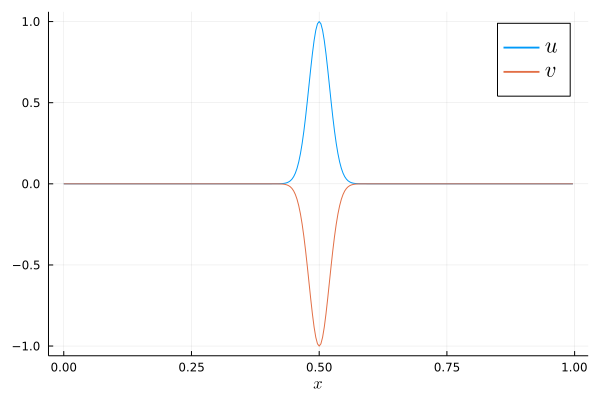

In [36]:
using Plots

r0=zeros(N,2)      # Discretización de los campos u y v
x = [dx*i for i in 0:N-1];      # Coordenadas x, necesarias para determinar el dato inicial.

x0 = 0.4; x1 = 0.6
u = @view r0[:,1]
v = @view r0[:,2]

b = 0.5
c = 0.02
for i in 1:N
    x[i] = dx*(i-1)
    u[i] = exp(-(x[i]-b)^2/(2*c^2))
    v[i] = -u[i]
end

plot(x, r0, label = ["\$u\$" "\$v\$"], xlabel = "\$x\$", legendfontsize = 15)


Creamos los Problemas

In [37]:
D_2_per = create_D_2_per(N)
D_4_per = create_D_4_per(N)
D_6_per = create_D_6_per(N)
D_8_per = create_D_8_per(N)

p2 = (dx, D_2_per)
p4 = (dx, D_4_per)
p6 = (dx, D_6_per)
p8 = (dx, D_8_per)
@time prob2 = ODEProblem(F!,r0,(0.0,T),p2);
@time prob4 = ODEProblem(F!,r0,(0.0,T),p4);
@time prob6 = ODEProblem(F!,r0,(0.0,T),p6);
@time prob8 = ODEProblem(F!,r0,(0.0,T),p8);

  0.000119 seconds (60 allocations: 2.750 KiB)
  0.000092 seconds (60 allocations: 2.750 KiB)
  0.000125 seconds (60 allocations: 2.750 KiB)
  0.000098 seconds (60 allocations: 2.750 KiB)


Resolvemos

In [38]:
@time sol2 = solve(prob2,RK4(),dt=dt);
@time sol4 = solve(prob4,RK4(),dt=dt);
@time sol6 = solve(prob6,RK4(),dt=dt);
@time sol8 = solve(prob8,RK4(),dt=dt);

  1.988069 seconds (410.88 k allocations: 347.928 MiB, 24.01% gc time, 14.13% compilation time: 100% of which was recompilation)
  2.469437 seconds (139.22 k allocations: 495.363 MiB)
  2.750453 seconds (129.49 k allocations: 460.911 MiB)
  3.319942 seconds (127.44 k allocations: 453.661 MiB)


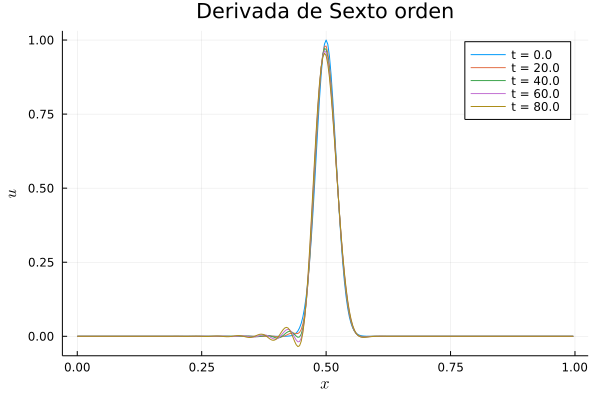

In [39]:
plt6 = plot()
# markSize = [6,4,3,2,1]
markSize = [6,4,3,3,3]
for i in 0:4
    # plot!(plt6,x, sol6(T*0.2*i)[:,1],shape=:auto,ms=markSize[i+1], label = "t = $(T*0.2*i)",xlim=(0.55,0.75),ylim=(-0.0015,0.00025),legend=:bottomright)
    # plot!(plt6,x, sol6(T*0.25*i)[:,1],shape=:auto,ms=markSize[i+1], label = "t = $(T*0.25*i)",xlim=(0.25,0.43),ylim=(-0.002,0.003),legend=:topleft)
    # plot!(plt6,x, sol6(T*0.2*i)[:,1],shape=:auto,ms=markSize[i+1], label = "t = $(T*0.2*i)",xlim=(0.49,0.51),ylim=(0.975,1.01))
    # plot!(plt6,x, sol6(T*0.2*i)[:,1],shape=:auto,ms=markSize[i+1], label = "t = $(T*0.2*i)")
    plot!(plt6,x, sol6(T*0.2*i)[:,1], label = "t = $(T*0.2*i)")
end
title!("Derivada de Sexto orden")
xlabel!("\$x\$")
ylabel!("\$u\$")
display(plt6)

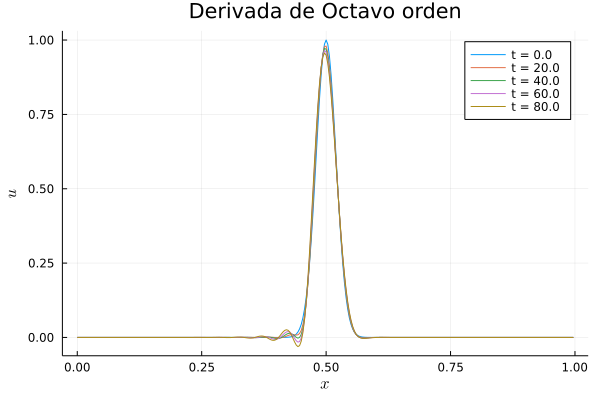

In [40]:
plt8 = plot()
for i in 0:4
    # plot!(plt8,x, sol8(T*0.2*i)[:,1],shape=:auto,ms=markSize[i+1], label = "t = $(T*0.2*i)",xlim=(0.55,0.75),ylim=(-0.0015,0.00025),legend=:bottomright)
    # plot!(plt8,x, sol8(T*0.25*i)[:,1],shape=:auto,ms=markSize[i+1], label = "t = $(T*0.25*i)",xlim=(0.25,0.43),ylim=(-0.002,0.003),legend=:topleft)
    # plot!(plt8,x, sol8(T*0.2*i)[:,1],shape=:auto,ms=markSize[i+1], label = "t = $(T*0.2*i)",xlim=(0.49,0.51),ylim=(0.975,1.01))
    # plot!(plt8,x, sol8(T*0.2*i)[:,1],shape=:auto,ms=markSize[i+1], label = "t = $(T*0.2*i)")
    plot!(plt8,x, sol8(T*0.2*i)[:,1], label = "t = $(T*0.2*i)")
end
title!("Derivada de Octavo orden")
xlabel!("\$x\$")
ylabel!("\$u\$")
display(plt8)

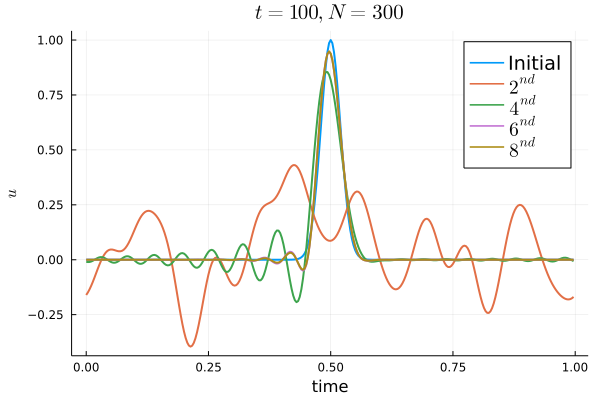

In [41]:
    plt_T = plot(x, sol2(T*0)[:,1], label = "Initial",xlab="time",ylab="\$u\$", linewidth=2, thickness_scaling = 1)
    plot!(plt_T, x, sol2(T)[:,1], label = "\$2^{nd}\$", legendfontsize = 13, linewidth=2, thickness_scaling = 1)
    plot!(plt_T, x, sol4(T)[:,1], label = "\$4^{nd}\$", legendfontsize = 13, linewidth=2, thickness_scaling = 1)
    plot!(plt_T, x, sol6(T)[:,1], label = "\$6^{nd}\$", legendfontsize = 13, linewidth=2, thickness_scaling = 1)
    plot!(plt_T, x, sol8(T)[:,1], label = "\$8^{nd}\$", legendfontsize = 13, linewidth=2, thickness_scaling = 1,title="\$t = 100, N=$(N)\$")


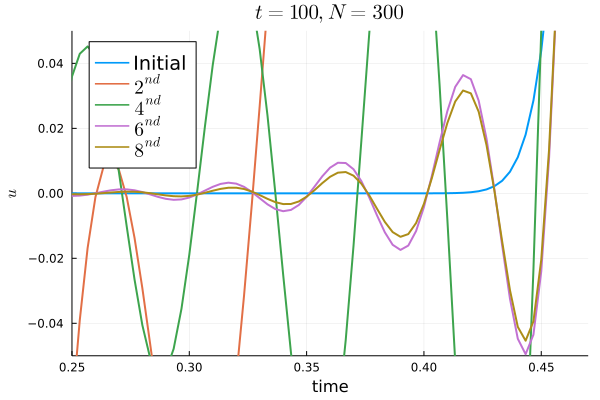

In [42]:
plot!(plt_T, xlim=(0.25,0.47),ylim=(-0.05,0.05), legendfontsize = 13,legend=:topleft)
# plt_T2 = copy([plt_T])
# plot!(plt_T2[1],xlim=(0.55,0.75),ylim=(-0.0015,0.00025), legendfontsize = 15,legend=:bottomright)
# plot(plt_T,plt_T2[1],layout=(1,2))

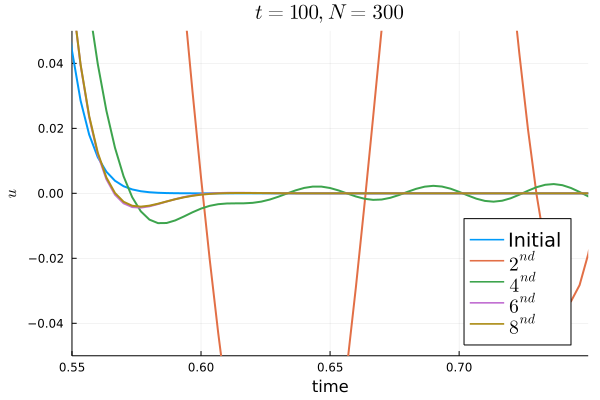

In [43]:
plot!(plt_T, xlim=(0.55,0.75),ylim=(-0.05,0.05), legendfontsize = 13,legend=:bottomright)


------
**3)** Cambie el integrador temporal. ¿Qué sucede si usa Euler? Explique.

------

------
**4)** Grafique los errores con distintas resoluciones y diferencias finitas. 

------

------
**5)** Haciendo diferencias de aproximaciones con distintas resoluciones y tomando normas apropiadas, vea cual es el orden de convergencia del método.

------

In [77]:
N = 1000            # Numeros de puntos en la discretización espacial
L = 1.0            # Intervalo espacial

T = 10.            # Tiempo final


10.0

In [78]:
r0N=zeros(N,2)      # Discretización de los campos u y v
dxN = L/(N)           # dx
dtN = 1. *dxN;        # Tomamos dt ≈ dx/speed_max, para mantener la condición CFL y
                   # Garantizar la estabilidad del algoritmo.

r02N=zeros(2*N,2)      # Discretización de los campos u y v
dx2N = dxN/2.0           # dx
dt2N = 1. *dx2N;        # Tomamos dt ≈ dx/speed_max, para mantener la condición CFL y
                   # Garantizar la estabilidad del algoritmo.

r04N=zeros(4*N,2)      # Discretización de los campos u y v
dx4N = dxN/4.0           # dx
dt4N = 1. *dx4N;        # Tomamos dt ≈ dx/speed_max, para mantener la condición CFL y
                   # Garantizar la estabilidad del algoritmo.

xN = [dxN*i for i in 0:N-1];      # Coordenadas x, necesarias para determinar el dato inicial.
# xN = [dxN*(i-1) for i in 1:N];      # Coordenadas x, necesarias para determinar el dato inicial.

x2N = [dx2N*i for i in 0:2*N-1];      # Coordenadas x, necesarias para determinar el dato inicial.
x4N = [dx4N*i for i in 0:4*N-1];      # Coordenadas x, necesarias para determinar el dato inicial.

print(size(x4N))
print(x4N[end])

x0 = 0.4; x1 = 0.6
uN = @view r0N[:,1]
vN = @view r0N[:,2]

u2N = @view r02N[:,1]
v2N = @view r02N[:,2]

u4N = @view r04N[:,1]
v4N = @view r04N[:,2]

for j in 1:N
    # xN[i] = dxN*(i-1)
    if xN[j] > x0 && xN[j] < x1
        uN[j] = (xN[j] - x0)^8 * (xN[j] - x1)^8 / (0.5*(x1-x0))^16
        vN[j] = -uN[j]
    end
end


for i in 1:2*N
    # x2N[i] = dx2N*(i-1)
    if x2N[i] > x0 && x2N[i] < x1
        u2N[i] = (x2N[i] - x0)^8 * (x2N[i] - x1)^8 / (0.5*(x1-x0))^16
        v2N[i] = -u2N[i]
    end
end


for i in 1:4*N
    # x4N[i] = dx2N*(i-1)
    if x4N[i] > x0 && x4N[i] < x1
        u4N[i] = (x4N[i] - x0)^8 * (x4N[i] - x1)^8 / (0.5*(x1-x0))^16
        v4N[i] = -u4N[i]
    end
end


# plot(xN, r0N, label = ["\$u\$" "\$v\$"],markershape=:circle,xlim=(0.0,1.0),xticks=0.0:dx2N:L, xlabel = "\$x\$", legendfontsize = 15)
plot(xN, r0N, label = ["\$u\$" "\$v\$"],markershape=:circle,xlim=(0.0,1.0),xticks=0.0:dxN:L, xlabel = "\$x\$", legendfontsize = 15)
# plot!(x2N, r02N, label = ["\$u2N\$" "\$v2N\$"], xlabel = "\$x\$", legendfontsize = 15)
plot!(x4N, r04N, label = ["\$u4N\$" "\$v4N\$"],markershape=:square, xlabel = "\$x\$", legendfontsize = 15)

(4000,)0.99975

In [88]:
D_2_perN = create_D_2_per(N)
D_2_per2N = create_D_2_per(2*N)
D_2_per4N = create_D_2_per(4*N)

# D_2_perN = create_D_8_per(N)
# D_2_per2N = create_D_8_per(2*N)
# D_2_per4N = create_D_8_per(4*N)

# D_2_perN = create_D_6_per(N)
# D_2_per2N = create_D_6_per(2*N)
# D_2_per4N = create_D_6_per(4*N)

p = (dx, D_2_perN)
p2 = (dx/2, D_2_per2N)
p4 = (dx/4, D_2_per4N)
@time prob = ODEProblem(F!,r0N,(0.0,T),p);
@time prob2 = ODEProblem(F!,r02N,(0.0,T),p2);
@time prob4 = ODEProblem(F!,r04N,(0.0,T),p4);

  0.000119 seconds (60 allocations: 2.750 KiB)
  0.000092 seconds (60 allocations: 2.750 KiB)
  0.000207 seconds (60 allocations: 2.750 KiB)


In [89]:
@time sol = solve(prob,RK4(),dt=dt);
@time sol2 = solve(prob2,RK4(),dt=dt/2);
@time sol4 = solve(prob4,RK4(),dt=dt/4);

  0.183854 seconds (4.30 k allocations: 49.319 MiB)
  0.833302 seconds (14.90 k allocations: 194.948 MiB)
  3.598085 seconds (29.73 k allocations: 777.846 MiB)


In [66]:
typeof(sol(1*T/100)[:,:])

Matrix{Float64} (alias for Array{Float64, 2})

┌ Info: Saved animation to 
│   fn = H:\2022\PDE_FAMAF\GIT_Famaf_PDE\Problems\Numéricos\Tarea 2\wave_anim_fps10_Q.gif
└ @ Plots C:\Users\invmecanica-m8\.julia\packages\Plots\lW9ll\src\animation.jl:137


Plots.AnimatedGif("H:\\2022\\PDE_FAMAF\\GIT_Famaf_PDE\\Problems\\Numéricos\\Tarea 2\\wave_anim_fps10_Q.gif")
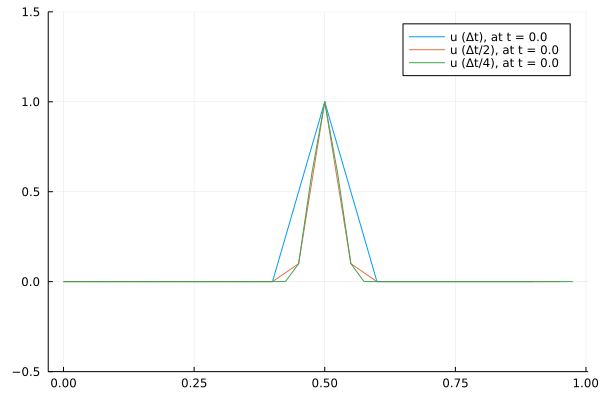

In [67]:
anim = @animate for i in 0:100
    plot(xN, sol(i*T/100)[:,1], ylim = (-0.5, 1.5), label = "u (Δt), at t = $(i*T/100)")
    plot!(x2N, sol2(i*T/100)[:,1], ylim = (-0.5, 1.5), label = "u (Δt/2), at t = $(i*T/100)")
    plot!(x4N, sol4(i*T/100)[:,1], ylim = (-0.5, 1.5), label = "u (Δt/4), at t = $(i*T/100)")
    # plot!(x2N, sol2(i*T/(100*2))[:,1], ylim = (-0.5, 1.5), label = "u (Δt/2), at t = $(i*T/100)")
    # plot!(x2N, sol2(i*T/100*2)[:,1], ylim = (-0.5, 1.5), label = "u (Δt/2), at t = $(i*T/100)")
    # plot!(x4N, sol4(i*T/100*4)[:,1], ylim = (-0.5, 1.5), label = "u (Δt/4), at t = $(i*T/100)")
    
end

gif(anim, "wave_anim_fps10_Q.gif", fps = 10)

In [50]:
#Función de ayuda:
function Q(sol1, sol2, sol4, t, i)
    return norm(sol1(t)[1:end,i] - sol2(t)[1:2:end,i])/norm(sol2(t)[1:2:end,i] - sol4(t)[1:4:end,i])
end
#= Modo de uso:
Q(sol1,sol2,sol4,dt,1)
plot(sol1.t,map(x -> Q(sol1,sol2,sol4,x,1), sol1.t))
=#



Q (generic function with 1 method)

In [51]:
function Q_vec(t,sol1, sol2, sol4)
    return norm(sol1(t)[:] - sol2(t)[1:2:end])/norm(sol2(t)[1:2:end] - sol4(t)[1:4:end])
end


Q_vec (generic function with 1 method)

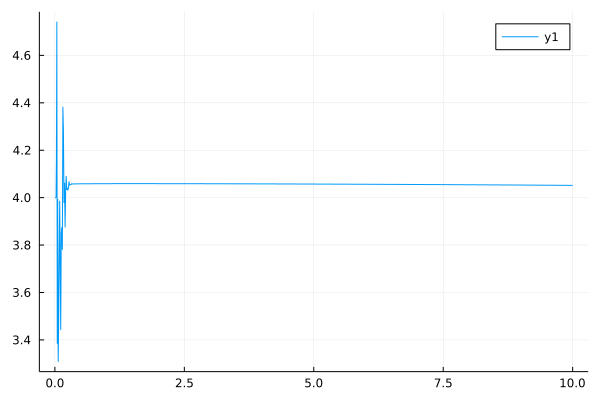

In [90]:
plot(sol.t,map(xt -> Q(sol,sol2,sol4,xt,2), sol.t))
# plot(sol.t,map(xt -> Q(sol,sol,sol,xt,1), sol.t))


In [76]:
map(xt -> Q(sol,sol2,sol4,xt,1), sol.t[2])

4.0004394861209605

------
**6)** Codifique la ecuación de burgers, $\frac{\partial u}{\partial t} = - u \frac{\partial u}{\partial x}$ y evolucione. Describa que sucede y explique.

------

------
**7)** **Para los ambiciosos:** a) codifique otras ecuaciones; b) implemente disipación de Kreiss-Oliger; c) incorpore fuentes; d) vea sistemas con distintas escalas temporales; e) para este último caso implemente métodos IMEX de integración temporal; f) trate de optimizar el método numérico para hacerlo más eficiente.
Un ejemplo de un sistema con distintas escalas temporales es:
$$
\begin{align}
u_t &= v_x \\
v_t &= u_x + \frac{1}{\epsilon} (u_x - v)
\end{align}
$$
with $\epsilon > 0$ muy pequeño.

------